# Who has access to LA's parks?

Since the pandemic began, a person's ability to maintain good physical and mental health has become even more dependent on their access to outdoor spaces. 

Therefore, we want to know: **How accessible are parks and other public recreation facilities in the lowest income neighborhoods and highest income neighborhoods in Los Angeles, CA?**

Our hypothesis is that we will find fewer parks in lower income areas than the higher income areas.

We will explore this question by creating charts, static maps, and interactive maps to better understand the socioeconomic landscape of Los Angeles. Let's jump in!

<img src="https://studio-mla.com/wp-content/uploads/2017/09/Studio-MLA_Vista-Hermosa-10_Hunter-Kerhart_WEB.jpg" width=600>

## Data sources
We based our research on the following data sources:

[LA city income data from the U.S. Census Bureau](https://censusreporter.org/profiles/16000US0644000-los-angeles-ca/)

[Park data from the County of Los Angeles Department of Parks and Recreation](https://data.lacity.org/Community-Economic-Development/Department-of-Recreation-and-Parks-Facility-and-Pa/ax8j-dhzm)

## Importing the libraries
The first thing we need to do is import all of the libraries that will allow us to explore our data and create our beautiful charts and maps.

In [1]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon
import contextily as ctx
# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps
import plotly.express as px

/opt/conda/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.1-CAPI-1.13.3) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


## Analyzing LA incomes by census tract
We will create 3 charts that will help us compare the median household per income of all LA census tracts. We will do this to identify which census tracts are of interest to us for our research. The charts we will create include:

- City of Los Angeles Census Tract Income Frequency
- Top 10 Census Tracts with Lowest Incomes in the City of Los Angeles
- Top 10 Census Tracts with Highest Incomes in the City of Los Angeles

### Importing the data
First we need to import our income data.

In [2]:
income1=pd.read_csv('Data1/Income_KB2_.csv')
income1.head()

,geoid,Census_Tract,Median_Household_Income,Median_Household_Income_<50K,Median_Household_Income_<100K,Median_Household_Income_<250K
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,NaN,NaN,250001.0
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,NaN,NaN,250001.0
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,NaN,NaN,250001.0
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,NaN,NaN,231250.0
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,NaN,NaN,224962.0


### Creating the charts
Now we can start to create our charts. 

We will be using a function to produce histogram charts for median household income of different income groups. In this case, the income groups are Median_Household_Income_<50K, Median_Household_Income_<100K, and Median_Household_Income_<250K.

In [3]:
def get_histogram(column = 'Median_Household_Income'):
    series_to_plot=income1[column]

    plt.figure(figsize=(10,5))

    plt.hist(series_to_plot,bins=50,color='skyblue')

    plt.axvline(series_to_plot.mean(), color='k', linestyle='dashed', linewidth=1)
    plt.axvline(series_to_plot.median(), color='r', linestyle='dashed', linewidth=1)
    min_ylim, max_ylim = plt.ylim()
    plt.text(series_to_plot.mean()*1.1, max_ylim*0.9, 'Mean: {:.2f}'.format(series_to_plot.mean()))
    plt.text(series_to_plot.median()*1.1, max_ylim*0.8, 'Median: {:.2f}'.format(series_to_plot.median()),color='r')
    plt.title(column + ' in Los Angeles')

In [4]:
indicators = [ 'Median_Household_Income','Median_Household_Income_<50K',
 'Median_Household_Income_<100K',
 'Median_Household_Income_<250K',]

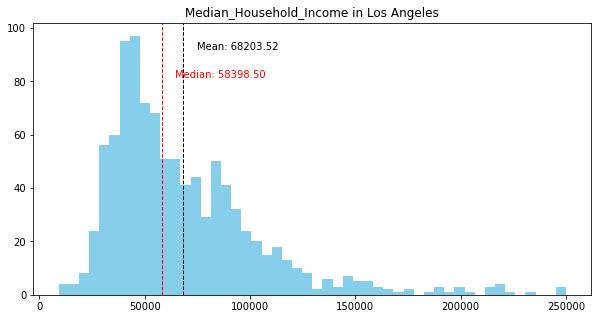

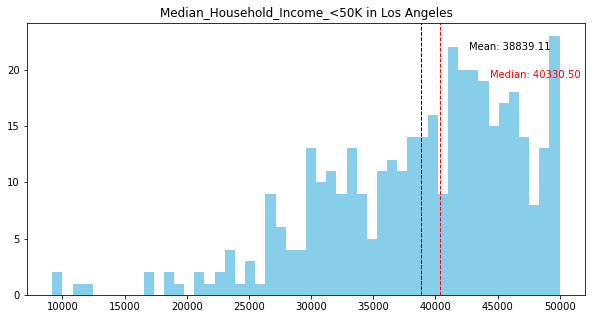

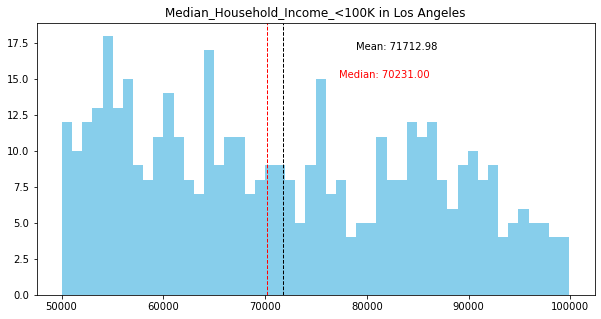

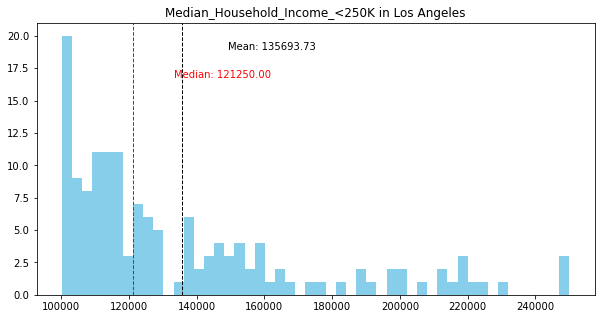

In [5]:
for indicator in indicators:
    get_histogram(column=indicator)

Wow!!! The histograms are really insightful in visually presenting the distribution of median household incomes of different census tracts. We can see the average income in each income bracket.

Now we want to get started on creating charts of the top 10 census tracts with the highest and lowest median household incomes. The first thing we need to do is to sort our data set by income and create variables that will store the sorted data. Then we can create an income bar chart of the lowest incomes.

In [6]:
lowest_incomes = income1.sort_values(by='Median_Household_Income',ascending = True)
highest_incomes = income1.sort_values(by='Median_Household_Income',ascending = False)

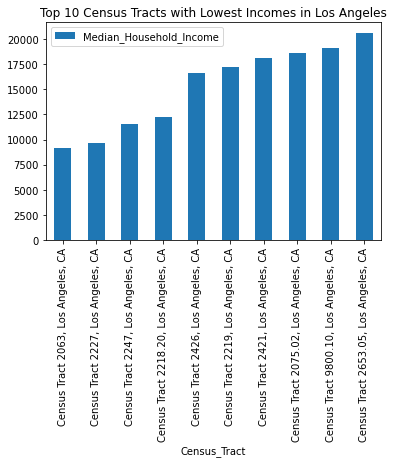

In [7]:
lowest_incomes.head(10).plot.bar(x='Census_Tract',
                            y='Median_Household_Income', 
                            title='Top 10 Census Tracts with Lowest Incomes in Los Angeles')

The output of our code is a chart titled "Top 5 Census Tracts with Lowest Incomes in the City of Los Angeles", which has census tracts in the x axis and median household income in the y axis. From this chart, we learn that the census tracts with the lowest median household incomes have incomes ranging from below 10,000 to slightly above 20,000.

Now we can make a chart for the highest incomes.

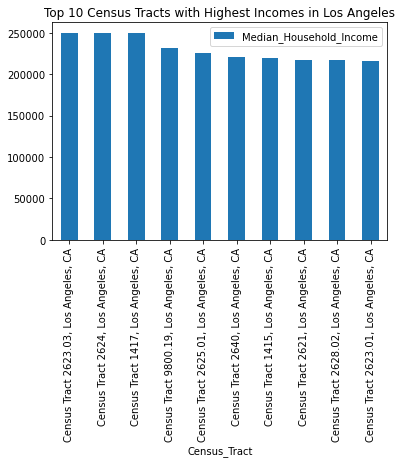

In [8]:
highest_incomes.head(10).plot.bar(x='Census_Tract',
                            y='Median_Household_Income', 
                            title='Top 10 Census Tracts with Highest Incomes in Los Angeles')

The output of our code is a chart titled "Top 5 Census Tracts with Highest Incomes in the City of Los Angeles", which has census tracts in the x axis and median household income in the y axis. From this chart we learn that the census tracts with the hgihest median household incomes have incomes around 250,000. 

All of these charts help us understand what the income distribution looks like between LA census tracts. With this information we can identify the high and low income census tracts and compare their park access.

## Mapping parks and income 
Perfect! Now that we have created our charts, the next thing we want to do is create interactive maps featuring park and income layers.

### Cleaning the Data
We need to do some data cleaning before we create the maps. Looking at the bottom of this chart we can see that there are some null values we want to get rid of.

In [9]:
income2=gpd.read_file('Data2/Income_KB.geojson')
columns_to_keep2 = ['geoid','name','B19013001','geometry']
income2 = income2[columns_to_keep2]
income2.columns = ['geoid',
 'Census_Tract',
 'Median_Household_Income',
 'geometry']
income2.head()

,geoid,Census_Tract,Median_Household_Income,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


Let's see how many null values there are.

In [10]:
lowest_incomes2 = income2.sort_values(by='Median_Household_Income',ascending = True)
lowest_incomes2.tail(15)

,geoid,Census_Tract,Median_Household_Income,geometry
340,14000US06037141700,"Census Tract 1417, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.45322 34.13557, -118.4531..."
831,14000US06037262303,"Census Tract 2623.03, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.49599 34.07105, -118.4959..."
832,14000US06037262400,"Census Tract 2624, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.52146 34.11764, -118.5214..."
847,14000US06037265301,"Census Tract 2653.01, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.45549 34.07585, -118.4546..."
989,14000US06037980008,"Census Tract 9800.08, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.50267 34.22121, -118.5015..."
990,14000US06037980009,"Census Tract 9800.09, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.33707 34.14160, -118.3361..."
992,14000US06037980014,"Census Tract 9800.14, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.26088 33.76850, -118.2602..."
995,14000US06037980020,"Census Tract 9800.20, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.34412 34.21700, -118.3438..."
996,14000US06037980021,"Census Tract 9800.21, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.40183 34.26509, -118.4017..."
997,14000US06037980022,"Census Tract 9800.22, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.50266 34.30809, -118.5026..."


Now we will get rid of the null values.

In [11]:
income2 = income2.drop([847, 989, 990, 992, 995, 996, 997, 998, 1000, 1001, 1002, 1003])

### Creating the static maps

Before we begin to create our interactive map, we should first create a nice static map of median household incomes. This will allow us to really visualize where the higher income and lower income communities are in Los Angeles. Having these communities in mind will help us be more intentional when we bring in our park data!

Text(0.5, 1.0, 'Census Tracts with median household incomes less than $125,000')

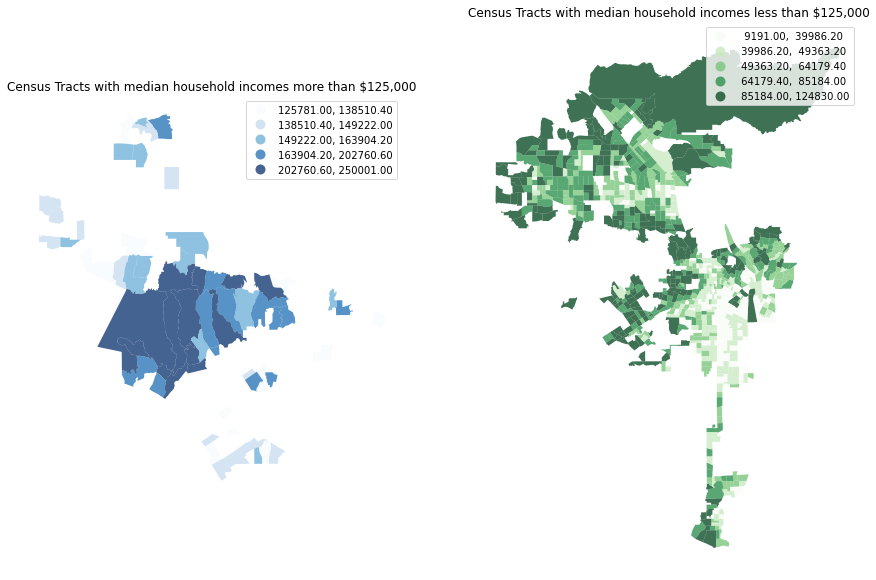

In [12]:
fig, axs = plt.subplots(1, 2, figsize=(15, 12))

ax1, ax2 = axs

income2[income2.Median_Household_Income > 125000].plot(column='Median_Household_Income',
            cmap='Blues',
            scheme='quantiles',
            k=5,
            edgecolor='white',
            linewidth=0.,
            alpha=0.75,
            ax=ax1, # this assigns the map to the subplot,
            legend=True
           )

ax1.axis("off")
ax1.set_title("Census Tracts with median household incomes more than $125,000")

income2[income2.Median_Household_Income < 125000].plot(column='Median_Household_Income',
            cmap='Greens',
            scheme='quantiles',
            k=5,
            edgecolor='white',
            linewidth=0.,
            alpha=0.75,
            ax=ax2, # this assigns the map to the subplot
            legend=True
           )

ax2.axis("off")
ax2.set_title("Census Tracts with median household incomes less than $125,000")

TWO MAPS?!?! WOW! One map features the bottom half of median household incomes and one features the upper half of median household incomes in Los Angeles. These maps show that the higher income communities are concentrated in hills and valleys north west of Los Angeles. Conversely, the lower income communities are spread around Los Angeles, with the lowest incomes being in the South LA area.

### Creating the interactive map
Now we can get started on creating our interactive data maps! We will first make an interactive choropleth map that shades the census tracts according to how high or low their median household income is. We are able to hover over each census tract to see the census tract number.

In [13]:
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 10,
               tiles='OpenStreetMap', 
               attribution='CartoDB')

choropleth = folium.Choropleth(
                  geo_data=income2, 
                  data=income2,         
                  key_on='feature.properties.Census_Tract',
                  columns=['Census_Tract', 'Median_Household_Income'],
                  fill_color='YlOrRd',
                  line_weight=1, 
                  fill_opacity=0.8,
                  line_opacity=0.5, 
                  legend_name='Median Household Income per Census Tract (ACS 2019 5-Year Estimates)').add_to(m)   

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['Census_Tract'],labels=False)
)
m


How beautiful!! The census tracts with higher incomes have a darker red color. This color scheme is presented in the key in the top right.

Now let's add our parks and recreational facilities to our income layer.

In [14]:
parks = pd.read_csv('Data3/PR1.csv')
parks.head()

,LocationType,Location_Name,StNumber,StNumberFraction,StDirection,StName,StSuffix,StSuffixDirection,AddressType,AddressTypeValue,...,CrossStSuffix,CrossStSuffixDirection,City,State,Zip,Website,Phone,CouncilDistrict,X,Y
0,Parks,La Mirada Park Acquisition Site,5401.0,NaN,W,La Mirada,Ave,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90029\n(34.0942, -118.307)",CA,90029,NaN,(310) 548-7675,13,34.094208,-118.306999
1,Gardens,Drew St,3304.0,NaN,N,Drew,St,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90065\n(34.12, -118.243)",CA,90065,NaN,(213) 485-5572,13,34.119958,-118.242682
2,Parks,Avalon-San Pedro Park,4025.0,NaN,NaN,Avalon,Blvd,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90011\n(34.0104, -118.266)",CA,90011,NaN,(310) 548-7675,9,34.010389,-118.265542
3,Parks,11th Avenue Park,6116.0,NaN,NaN,11th,Ave,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90043\n(33.9845, -118.329)",CA,90043,NaN,(310) 548-7675,8,33.984488,-118.329232
4,Gardens,El Sereno Community Garden,5450.0,NaN,E,Huntington,Dr,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90032\n(34.0923, -118.162)",CA,90032,NaN,(213) 485-5572,14,34.092346,-118.161574


Now we can create our interactive map!

In [15]:
for index, row in parks.iterrows():
    tooltip_text = row.Location_Name
    folium.Marker(
        [row.X,row.Y], 
        popup=row.Location_Name, 
        tooltip=tooltip_text,
        icon=folium.Icon(color='green')
).add_to(m)

m

This map allows us to hover over each park marker to see the park name, and we can also hover over the census tracts to see the census tract number. It is helpful to visually compare the locations of the parks and recreational facilities to the high and low income census tracts.

### Merging the data
Now we will create a color coded interactive map of each of our census tracts showing the amount of parks and facilities located in them. We will start by projecting our park data and then joining it to our census data!

In [16]:
parks_listings = gpd.GeoDataFrame(parks,   geometry=gpd.points_from_xy(parks.Y, parks.X))
type(parks_listings)

geopandas.geodataframe.GeoDataFrame

In [17]:
parksss = parks_listings.set_crs("EPSG:4326")
incomepark = gpd.sjoin(income2,parksss)

Now that our data is projected and joined, we can group our data to create a count of how many parks are located in each census tract. 

In [18]:
grouped = incomepark.groupby('Census_Tract').size()
df = grouped.to_frame().reset_index()
df.columns = ['Census_Tract', 'listings_count']
df

,Census_Tract,listings_count
0,"Census Tract 1095, Los Angeles, CA",2
1,"Census Tract 1216, Los Angeles, CA",1
2,"Census Tract 1221.22, Los Angeles, CA",1
3,"Census Tract 1242.01, Los Angeles, CA",1
4,"Census Tract 1287.02, Los Angeles, CA",1
...,...,...
192,"Census Tract 2920, Los Angeles, CA",1
193,"Census Tract 2965, Los Angeles, CA",1
194,"Census Tract 7011, Los Angeles, CA",2
195,"Census Tract 9800.10, Los Angeles, CA",11


Let's add the listings count column to the rest of our spatial join data

In [19]:
merged = incomepark.merge(df, on='Census_Tract')
merged.head()

,geoid,Census_Tract,Median_Household_Income,geometry,index_right,LocationType,Location_Name,StNumber,StNumberFraction,StDirection,...,CrossStSuffixDirection,City,State,Zip,Website,Phone,CouncilDistrict,X,Y,listings_count
0,14000US06037109500,"Census Tract 1095, Los Angeles, CA",33387.0,"MULTIPOLYGON (((-118.45528 34.27935, -118.4552...",146,Outdoor Fitness Equipment,Fox & Laurel Park,14353.0,NaN,NaN,...,NaN,"Los Angeles, CA 91340\n(34.2716, -118.446)",CA,91340,NaN,NaN,7,34.271638,-118.446271,2
1,14000US06037109500,"Census Tract 1095, Los Angeles, CA",33387.0,"MULTIPOLYGON (((-118.45528 34.27935, -118.4552...",218,Parks,Fox & Laurel Park,14353.0,NaN,NaN,...,NaN,"Los Angeles, CA 91340\n(34.2716, -118.446)",CA,91340,NaN,NaN,7,34.271638,-118.446271,2
2,14000US06037121600,"Census Tract 1216, Los Angeles, CA",79474.0,"MULTIPOLYGON (((-118.41439 34.21985, -118.4129...",56,Parks,Bellaire Avenue Park,7960.0,NaN,N,...,NaN,"Los Angeles, CA 91605\n(34.2156, -118.413)",CA,91605,NaN,(818) 506-7456,2,34.215610,-118.412666,1
3,14000US06037122122,"Census Tract 1221.22, Los Angeles, CA",41811.0,"MULTIPOLYGON (((-118.37948 34.22330, -118.3774...",86,Swimming Pools - Summer,Sun Valley Park Pool,8123.0,NaN,NaN,...,NaN,"Los Angeles, CA 91352\n(34.2182, -118.37)",CA,91352,http://www.laparks.org/dos/aquatic/facility/su...,(818) 252-0835,6,34.218154,-118.370428,1
4,14000US06037124201,"Census Tract 1242.01, Los Angeles, CA",64364.0,"MULTIPOLYGON (((-118.37905 34.18853, -118.3790...",49,Parks,Victory - Vineland Park,11117.0,NaN,NaN,...,NaN,"Los Angeles, CA 91606\n(34.1869, -118.373)",CA,91606,http://www.laparks.org/dos/parks/facility/vict...,(818) 985-9516,2,34.186926,-118.372700,1


### Parks and recreation facilities per census tract map
Now that our data is projected, joined, merged etc, it is ready to be presented as a folium map! Like we mentioned earlier, our goal is to visually present the census tracts with the amount of parks and facilities that they contain.

In [20]:
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 10,
               tiles='OpenStreetMap', 
               attribution='CartoDB')

choropleth = folium.Choropleth(
                  geo_data=merged, 
                  data=merged,         
                  key_on='feature.properties.Census_Tract',
                  columns=['Census_Tract', 'listings_count'],
                  fill_color='YlGn',
                  line_weight=1, 
                  fill_opacity=0.8,
                  line_opacity=0.5, 
                  legend_name='Parks and Recreation Facilities Per Census Tract').add_to(m)   

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['Census_Tract'],labels=False)
)
m

### Normalizing The Data
We want to normalize our data so that we can see how many parks there are per 10,000 people in each census tract. First we need to open our data and merge the population of the census tracts to the corresponding geometric information we have in our income2 data.

In [21]:
#read pop data

pop=pd.read_csv('Data1/pop.csv')

pop = pop[['name','B01003001']]

pop.columns = ['Census_Tract','TotalPop']

In [22]:
#merge pop data to income data

income2pop = income2.merge(pop, on='Census_Tract')

income2pop.head()

,geoid,Census_Tract,Median_Household_Income,geometry,TotalPop
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",4283
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",3405
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",6347
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",3702
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",3884


In [23]:
#merge pop/income data to parks per census tract data

mergedpop = income2pop.merge(df, on='Census_Tract')

Now we can normalize our data by dividing the number of parks in a census tract by the census tract population.

In [24]:
#normalize data

mergedpop['parks_per_10000'] = mergedpop['listings_count']/mergedpop['TotalPop']*10000

In [25]:
mergedpop.sort_values(by="parks_per_10000").tail()

,geoid,Census_Tract,Median_Household_Income,geometry,TotalPop,listings_count,parks_per_10000
106,14000US06037219700,"Census Tract 2197, Los Angeles, CA",50220.0,"MULTIPOLYGON (((-118.35563 34.02289, -118.3556...",4507,12,26.625250
191,14000US06037278001,"Census Tract 2780.01, Los Angeles, CA",109468.0,"MULTIPOLYGON (((-118.41874 33.95974, -118.4166...",2508,7,27.910686
95,14000US06037214501,"Census Tract 2145.01, Los Angeles, CA",87364.0,"MULTIPOLYGON (((-118.36143 34.07610, -118.3611...",2702,8,29.607698
196,14000US06037980019,"Census Tract 9800.19, Los Angeles, CA",231250.0,"MULTIPOLYGON (((-118.59919 34.07436, -118.5991...",138,1,72.463768
195,14000US06037980010,"Census Tract 9800.10, Los Angeles, CA",19167.0,"MULTIPOLYGON (((-118.25165 34.08038, -118.2515...",95,11,1157.894737


### Creating a normalized map
Next we are going to map our normalized data. We are going to create a map showing the top 20 census tracts with the highest number of parks per 10,000 people.

(-118.62030234999999, -118.15613865, 33.94286525, 34.14063974999999)

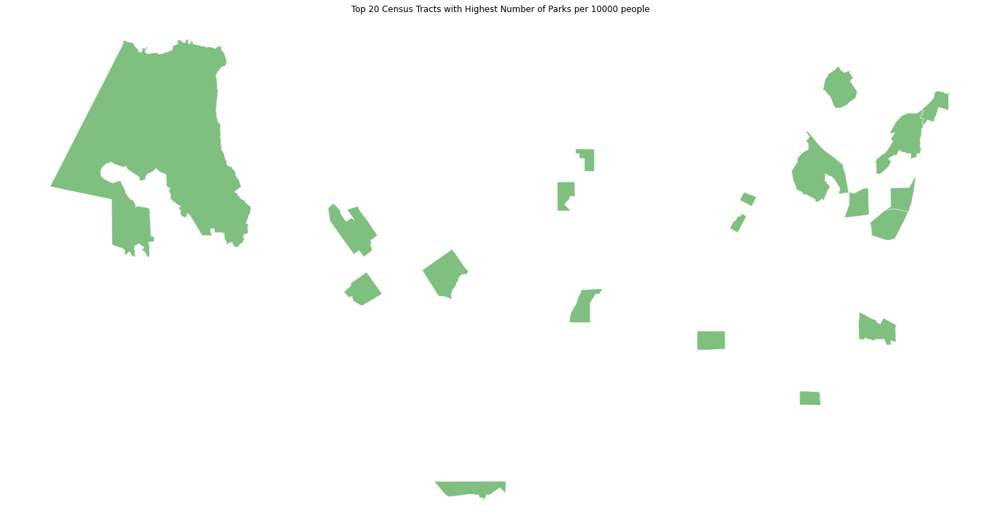

In [26]:
# map the top 20 geographies

fig,ax = plt.subplots(figsize=(25,25))

mergedpop.sort_values(by='parks_per_10000',ascending=False)[:20].plot(ax=ax,

                                                                 color='green',

                                                                 edgecolor='white',

                                                                 alpha=0.5,legend=True)





# title

ax.set_title('Top 20 Census Tracts with Highest Number of Parks per 10000 people')



# no axis

ax.axis('off')




Here we can see that the census tracts with the highest number of parks based on population size tend to be near the hills. Now we will create a park showing all of the normalized census tracts with at least one park.

Text(0.5, 1.0, 'Parks per 10,000 people')

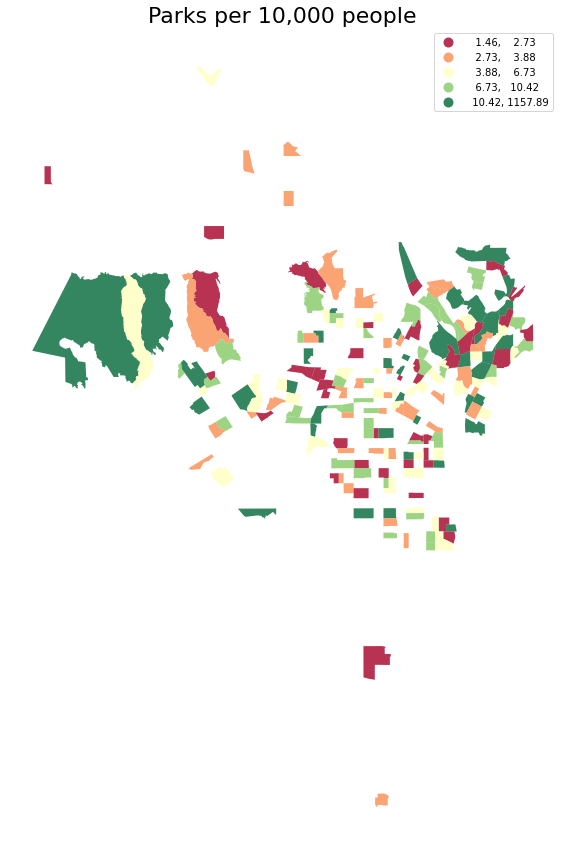

In [27]:
fig,ax = plt.subplots(figsize=(15,15))



mergedpop.plot(ax=ax,

        column='parks_per_10000',

        legend=True,

        alpha=0.8,

        cmap='RdYlGn',

        scheme='quantiles')



ax.axis('off')

ax.set_title('Parks per 10,000 people',fontsize=22)

This map shows us that several zipcodes with only a few parks are adjacent to zipcodes with various parks.

## Global Spatial Autocorrelation
Now we will conduct spatial autocorrelation to determine to what degree an existing pattern is random or not. 

### Spatial Weights
The first step is to attribute spatial weights to determine an area's neighborhood. We will use the KNN weight which will count the number of nearest neighbhors in the calculations. We will also row standardize our weights by dividing each weight by its row sum.

In [28]:
# calculate spatial weight

wq =  lps.weights.KNN.from_dataframe(mergedpop,k=8)

# Row-standardization

wq.transform = 'r'

### Spatial Lag
Now that we have our spatial weights assigned, we can use it to calculate the spatial lag. The spatial lag is a calculated assignment to each geography in the data that takes the average of all the neighbors as defined by the spatial weight to come up with a single associated value.


In [29]:
# create a new column for the spatial lag

mergedpop['parks_per_10000_lag'] = lps.weights.lag_spatial(wq, mergedpop['parks_per_10000'])

mergedpop.sample(10)

,geoid,Census_Tract,Median_Household_Income,geometry,TotalPop,listings_count,parks_per_10000,parks_per_10000_lag
63,14000US06037203200,"Census Tract 2032, Los Angeles, CA",56161.0,"MULTIPOLYGON (((-118.20340 34.05371, -118.2032...",5695,3,5.267779,9.713271
104,14000US06037218900,"Census Tract 2189, Los Angeles, CA",41019.0,"MULTIPOLYGON (((-118.32936 34.03119, -118.3291...",6149,5,8.131403,6.591764
158,14000US06037240020,"Census Tract 2400.20, Los Angeles, CA",38266.0,"MULTIPOLYGON (((-118.27169 33.95284, -118.2716...",5223,5,9.573042,5.144586
89,14000US06037212204,"Census Tract 2122.04, Los Angeles, CA",34196.0,"MULTIPOLYGON (((-118.28909 34.06181, -118.2884...",3584,1,2.790179,8.468451
118,14000US06037224410,"Census Tract 2244.10, Los Angeles, CA",26773.0,"MULTIPOLYGON (((-118.28401 34.03703, -118.2818...",3194,2,6.261741,5.282073
66,14000US06037203600,"Census Tract 2036, Los Angeles, CA",49922.0,"MULTIPOLYGON (((-118.21404 34.05515, -118.2140...",5276,3,5.686126,8.894636
31,14000US06037190802,"Census Tract 1908.02, Los Angeles, CA",50167.0,"MULTIPOLYGON (((-118.33321 34.09798, -118.3324...",2982,2,6.706908,8.025049
55,14000US06037201301,"Census Tract 2013.01, Los Angeles, CA",59955.0,"MULTIPOLYGON (((-118.19304 34.08590, -118.1929...",4498,3,6.669631,8.600754
125,14000US06037228320,"Census Tract 2283.20, Los Angeles, CA",43272.0,"MULTIPOLYGON (((-118.27029 34.00748, -118.2698...",3122,3,9.609225,5.101264
79,14000US06037207710,"Census Tract 2077.10, Los Angeles, CA",100972.0,"MULTIPOLYGON (((-118.27275 34.04276, -118.2725...",4667,2,4.285408,5.633558


### The Donut and Diamond
We will create a donut to show us census tracts with a low number of parks per 10,000 people, surrounded by census tracts with a high number of parks per 10,000. 

We will also create a diamond to show us census tracts with a high number of parks per 10,000 people, surrounded with census tracts with a high number of parks per 10,000 people.

### The Donut and Diamond
First we will create a column that calculates the difference betwen arrests and lag.

In [30]:
# create a column that calculates the difference betwen arrests and lag

mergedpop['parks_lag_diff'] = mergedpop['parks_per_10000'] - mergedpop['parks_per_10000_lag']

In [31]:
# output to get the head and tail

mergedpop.sort_values(by='parks_lag_diff')

,geoid,Census_Tract,Median_Household_Income,geometry,TotalPop,listings_count,parks_per_10000,parks_per_10000_lag,parks_lag_diff
73,14000US06037206010,"Census Tract 2060.10, Los Angeles, CA",42063.0,"MULTIPOLYGON (((-118.23924 34.06726, -118.2380...",4121,1,2.426595,150.881932,-148.455337
17,14000US06037185310,"Census Tract 1853.10, Los Angeles, CA",64671.0,"MULTIPOLYGON (((-118.22881 34.09588, -118.2264...",3131,1,3.193868,151.576928,-148.383060
77,14000US06037207103,"Census Tract 2071.03, Los Angeles, CA",29243.0,"MULTIPOLYGON (((-118.24557 34.06470, -118.2454...",2393,1,4.178855,151.453671,-147.274816
23,14000US06037187200,"Census Tract 1872, Los Angeles, CA",76042.0,"MULTIPOLYGON (((-118.25704 34.10773, -118.2566...",2963,2,6.749916,150.294484,-143.544569
22,14000US06037187102,"Census Tract 1871.02, Los Angeles, CA",56683.0,"MULTIPOLYGON (((-118.26166 34.10983, -118.2613...",3739,3,8.023536,151.234023,-143.210487
...,...,...,...,...,...,...,...,...,...
106,14000US06037219700,"Census Tract 2197, Los Angeles, CA",50220.0,"MULTIPOLYGON (((-118.35563 34.02289, -118.3556...",4507,12,26.625250,6.465983,20.159267
95,14000US06037214501,"Census Tract 2145.01, Los Angeles, CA",87364.0,"MULTIPOLYGON (((-118.36143 34.07610, -118.3611...",2702,8,29.607698,7.079533,22.528165
191,14000US06037278001,"Census Tract 2780.01, Los Angeles, CA",109468.0,"MULTIPOLYGON (((-118.41874 33.95974, -118.4166...",2508,7,27.910686,4.519243,23.391443
196,14000US06037980019,"Census Tract 9800.19, Los Angeles, CA",231250.0,"MULTIPOLYGON (((-118.59919 34.07436, -118.5991...",138,1,72.463768,7.327439,65.136329


Then we will find the census tract with highest negative difference.

In [32]:
# the FIPS with highest negative difference

mergedpop_donut = mergedpop.sort_values(by='parks_lag_diff').head(1)

mergedpop_donut

,geoid,Census_Tract,Median_Household_Income,geometry,TotalPop,listings_count,parks_per_10000,parks_per_10000_lag,parks_lag_diff
73,14000US06037206010,"Census Tract 2060.10, Los Angeles, CA",42063.0,"MULTIPOLYGON (((-118.23924 34.06726, -118.2380...",4121,1,2.426595,150.881932,-148.455337


Then we will find the census tract with highest positive difference.

In [33]:
##### the FIPS with highest positive difference

mergedpop_diamond = mergedpop.sort_values(by='parks_lag_diff').tail(1)

mergedpop_diamond

,geoid,Census_Tract,Median_Household_Income,geometry,TotalPop,listings_count,parks_per_10000,parks_per_10000_lag,parks_lag_diff
195,14000US06037980010,"Census Tract 9800.10, Los Angeles, CA",19167.0,"MULTIPOLYGON (((-118.25165 34.08038, -118.2515...",95,11,1157.894737,6.882901,1151.011835


The use of Mapbox satellite image tiles requires a user token, so let's get a token

In [34]:
# set the mapbox access token

token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'

px.set_mapbox_access_token(token)

Now let's focus on the donut, project it to WGS84, and get its centroid.

In [35]:
# subset donut, project to WGS84, and get its centroid

mergedpop_donut = mergedpop_donut.to_crs('epsg:4326')

In [36]:
# what's the centroid?

minx, miny, maxx, maxy = mergedpop_donut.geometry.total_bounds

center_lat_donut = (maxy-miny)/2+miny

center_lon_donut = (maxx-minx)/2+minx

Now let's focus on the diamond, project it to WGS84, and get its centroid.

In [37]:
# subset diamond, project to WGS84, and get its centroid

mergedpop_diamond = mergedpop_diamond.to_crs('epsg:4326')



# what's the centroid?

minx, miny, maxx, maxy = mergedpop_diamond.geometry.total_bounds

center_lat_diamond = (maxy-miny)/2+miny

center_lon_diamond = (maxx-minx)/2+minx

Now we can map our donut.

In [38]:
px.choropleth_mapbox(mergedpop_donut, 

                     geojson=mergedpop_donut.geometry, 

                     locations=mergedpop_donut.index, 

                     mapbox_style="satellite-streets",

                     zoom=12, 

                     center = {"lat": center_lat_donut, "lon": center_lon_donut},

                     hover_data=['listings_count','parks_per_10000','parks_per_10000_lag'],

                     opacity=0.4,

                     title='The Donut')

Let's map our diamond as well.

In [39]:
px.choropleth_mapbox(mergedpop_diamond, 

                     geojson=mergedpop_diamond.geometry, 

                     locations=mergedpop_diamond.index, 

                     mapbox_style="satellite-streets",

                     zoom=12, 

                     center = {"lat": center_lat_diamond, "lon": center_lon_diamond},

                     hover_data=['listings_count','parks_per_10000','parks_per_10000_lag'],

                     opacity=0.4,

                     title='The Diamond')

It looks like our donut and diamond are next to each other near the Dodger Stadium. Like we witnessed in class, the diamond and donut are next to each other because the diamond is predominatly parks compared to population, and the donut is predominatly population with no parks. Furthermore, the spatial lag of each will be either really negative or really positive.

## Spatial Lag Map
Now we will create a map that shows the entire dataframe by the spatial lag column.

Text(0.5, 1.0, 'Spatial Lag Parks per 1000 People')

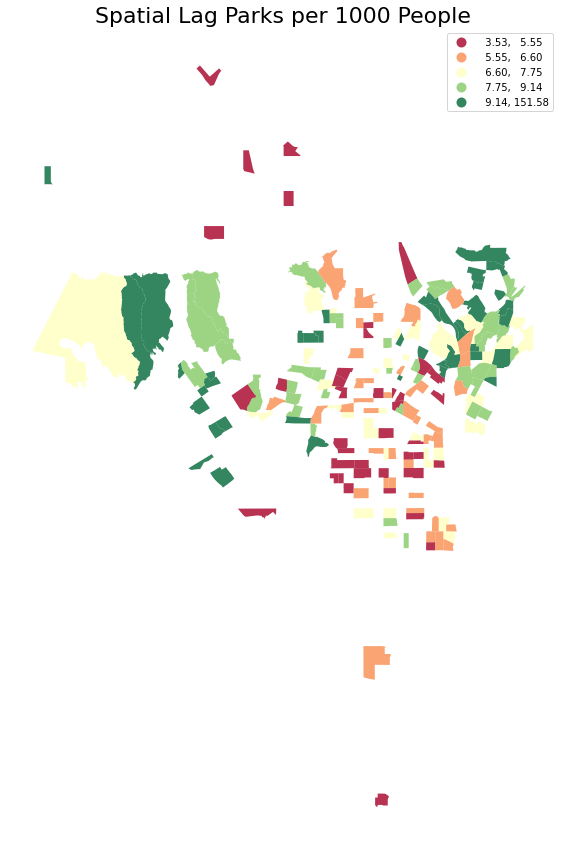

In [55]:
# use subplots that make it easier to create multiple layered maps

fig, ax = plt.subplots(figsize=(15, 15))



# spatial lag choropleth

mergedpop.plot(ax=ax,

         figsize=(15,15),

         column='parks_per_10000_lag',

         legend=True,

         alpha=0.8,

         cmap='RdYlGn',

         scheme='quantiles')



ax.axis('off')

ax.set_title('Spatial Lag Parks per 1000 People',fontsize=22)

Here the census tracts are assigned a color based on the average of all the neighbors as defined by the spatial weight. So the census tracts shown as dark green are surrounded by census tracts with lots of parks per 10,000 people. The ones shown as red are surrounded by census tracts with only a few parks per 10,000 people.

## Side-by-side maps
Let's compare our normalized map and our spatial lag map.

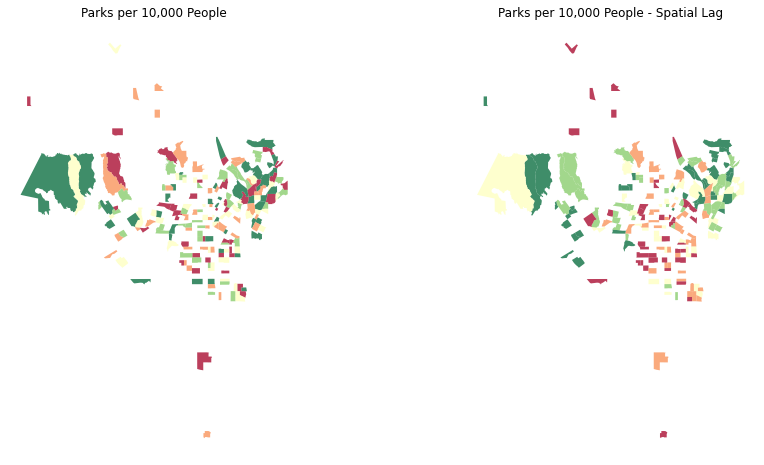

In [41]:
# create the 1x2 subplots

fig, ax = plt.subplots(1, 2, figsize=(15, 8))



# two subplots produces ax[0] (left) and ax[1] (right)



# regular count map on the left

mergedpop.plot(ax=ax[0], # this assigns the map to the left subplot

         column='parks_per_10000', 

         cmap='RdYlGn', 

         scheme='quantiles',

         k=5, 

         edgecolor='white', 

         linewidth=0, 

         alpha=0.75, 

           )





ax[0].axis("off")

ax[0].set_title("Parks per 10,000 People")



# spatial lag map on the right

mergedpop.plot(ax=ax[1], # this assigns the map to the right subplot

         column='parks_per_10000_lag', 

         cmap='RdYlGn', 

         scheme='quantiles',

         k=5, 

         edgecolor='white', 

         linewidth=0, 

         alpha=0.75

           )



ax[1].axis("off")

ax[1].set_title("Parks per 10,000 People - Spatial Lag")



plt.show()

The spatial lag map is quite a bit different than our normalized map. Some census tracts switched from green all the way to red meaning that they are surrounded by census tracts with a low park to population ratio. On the other hand, some census tracts switched from red to green meaning that they are surrounded by census tracts with a high park to population ratio. These maps tell us that although some census tract may not have parks, they can access parks by visiting neighboring census tracts.

## Interactive spatial lag satellite map
Now we will turn the static Parks per 10,000 People - Spatial Lag map into an interactive map.

We need to first project the data correctly.

In [42]:
# interactive version needs to be in WGS84

mergedpop_web = mergedpop.to_crs('EPSG:4326')

Next, we will find the centroid.

In [43]:
# what's the centroid?

minx, miny, maxx, maxy = mergedpop_web.geometry.total_bounds

center_lat_gdf_web = (maxy-miny)/2+miny

center_lon_gdf_web = (maxx-minx)/2+minx

We need to calculate our values for our map manually since we only have a continuous scale option available.

In [44]:
# some stats

mergedpop_web.parks_per_10000_lag.describe()

count    197.000000
mean      13.073741
std       28.395195
min        3.525329
25%        5.843121
50%        7.161204
75%        8.518701
max      151.576928
Name: parks_per_10000_lag, dtype: float64

In [45]:
# grab the median

median = mergedpop_web.parks_per_10000_lag.median()

Now that we have our values, we can plot our map.

In [46]:
fig = px.choropleth_mapbox(mergedpop_web, 

                     geojson=mergedpop_web.geometry, # the geometry column

                     locations=mergedpop_web.index, # the index

                     mapbox_style="satellite-streets",

                     zoom=9, 

                     color='parks_per_10000_lag',

                     color_continuous_scale='RdYlGn',

                     color_continuous_midpoint =median, # put the median as the midpoint

                     range_color =(0,median*2),

                     hover_data=['listings_count','parks_per_10000','parks_per_10000_lag'],

                     center = {"lat": center_lat_gdf_web, "lon": center_lon_gdf_web},

                     opacity=0.8,

                     width=1000,

                     height=800,

                     labels={

                             'parks_per_10000_lag':'Parks per 10000 (Spatial Lag)',

                             'parks_per_10000':'Parks per 1000',

                     })

fig.update_traces(marker_line_width=0.1, marker_line_color='white')

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

This map shows us that various census tracts in South Los Angeles are surrounded by census tracts with a low park to population ratio, and are thus shown in orange and red. On the other hand, the census tracts on the hills seem to fair better and are shown in green. 

This is really interesting because our previous maps showed us that South LA has many more parks than the census tracts in the hills. However, these maps show us that the hills still have a better proportion of people to parks than South LA.

## Moran's Plot
Now we will quantify the degree of the spatial correlations by testing for global autocorrelation for a continuous attribute. The Moran's I value will show us if there is a positive or negative autocorrelation.

Positive spatial autocorrelation: high values are close to high values, and/or low values are close to low values

Negative spatial autocorrelation: similar values are far from each other

In [47]:
y =  mergedpop.parks_per_10000
moran = Moran(y, wq)
moran.I

-0.006221153303630284

It looks like our Moran's I value is -0.006

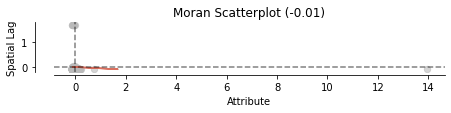

In [48]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)

plt.show()

This scatterplot shows us the calculated slope of the scatterplot of our "parks_per_10000" and "parks_per_10000_lag" columns. We can see that it is a negative shallow slope. Now we want to compare our Moran's I value to a simulation of 999 permutations to determine the probability of our observed pattern on the map being generated by an entirely random process. 

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.



(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fdf79a668b0>)

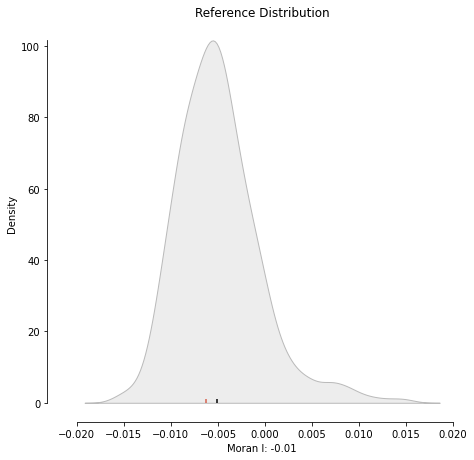

In [49]:
plot_moran_simulation(moran,aspect_equal=False)

This output is reference distribution. It is a sampling distribution of Moran’s I values under the null hypothesis that attribute values are randomly distributed across the study area.

Now let's determine our P-value.

In [50]:
moran.p_sim

0.419

0.447 is a very high P-value. We do not believe we can reject our null hypothesis with such a high P-value. This means that our map is more likely random than statistically significant. 

## Local Spatial Autocorrelation
Now we want to detect where the clusters are using Local Indicators of Spatial Association (LISA).

### Moral Local Scatterplot

In [51]:
# calculate local moran values

lisa = esda.moran.Moran_Local(y, wq)

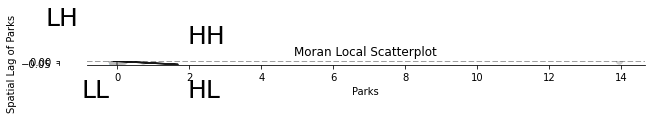

In [52]:
# Plot

fig,ax = plt.subplots(figsize=(10,15))



moran_scatterplot(lisa, ax=ax, p=0.05)

ax.set_xlabel("Parks")

ax.set_ylabel('Spatial Lag of Parks')



# add some labels

plt.text(1.95, 0.5, "HH", fontsize=25)

plt.text(1.95, -1, "HL", fontsize=25)

plt.text(-2, 1, "LH", fontsize=25)

plt.text(-1, -1, "LL", fontsize=25)

plt.show()

This scatterplot shows us that there are very few census tracts with a P-value less than 0.05 in each quadrant.

### Spatial Autocorrelation Map
We want to create a map that shows us the few census tracts with statistically significant clusters using the lisa_cluster function.

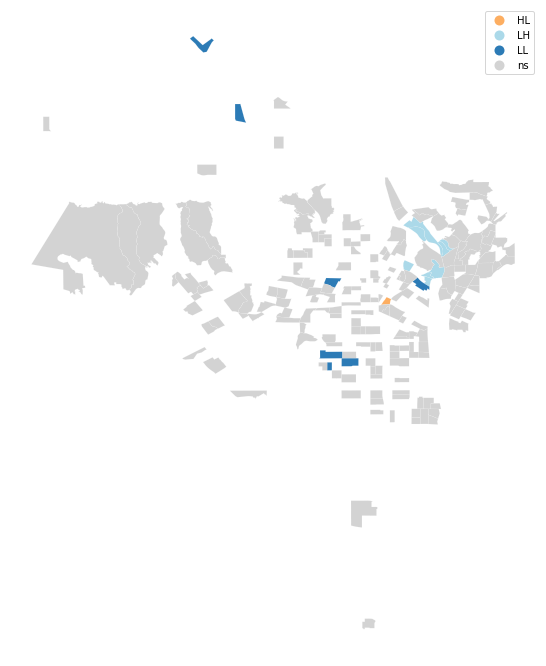

In [53]:
fig, ax = plt.subplots(figsize=(14,12))

lisa_cluster(lisa, mergedpop, p=0.05, ax=ax)

plt.show()

LISA classifies areas into four groups: high values near to high values (HH), Low values with nearby low values (LL), Low values with high values in its neighborhood, and vice-versa. This map shows us that there are a few census tracts that have low values and are near low values. 

Now we want to create side by side maps comparing census tracts with a P-value of .05 with census tracts with a P-value of .01

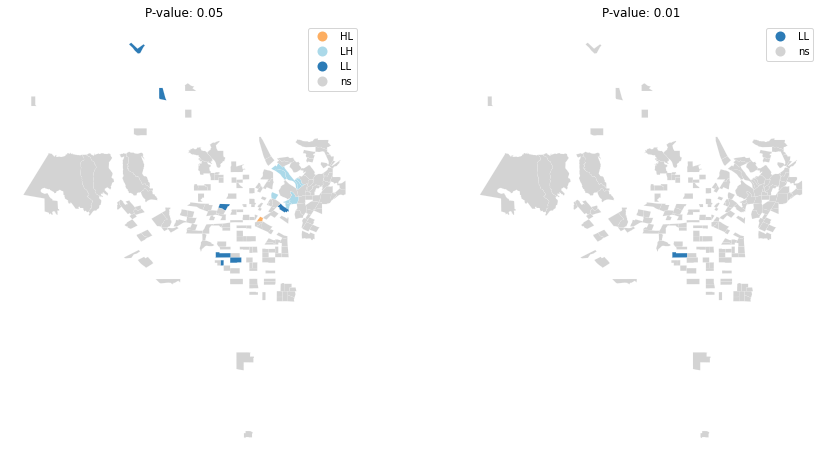

In [54]:
# create the 1x2 subplots

fig, ax = plt.subplots(1, 2, figsize=(15, 8))



# regular count map on the left

lisa_cluster(lisa, mergedpop, p=0.05, ax=ax[0])



ax[0].axis("off")

ax[0].set_title("P-value: 0.05")



# spatial lag map on the right

lisa_cluster(lisa, mergedpop, p=0.01, ax=ax[1])

ax[1].axis("off")

ax[1].set_title("P-value: 0.01")



plt.show()

Apparently, there is only one census tract with a P-value of .01 and a handful with a P-value of .05. These are the census tracts with statisticaly significant, spatially autocorrelated geographies.

## Conclusion
WOW!! What a journey! From our analysis we learned that: 
- many census tracts don't have any parks and facilities 
- the census tracts with 8 or more parks and facilities tend to have greater median household incomes compared to those with 7 or less parks and facilities
- the highest income areas (Beverly Hills and adjacent hills communities) have fewer parks


After normalizing our data, and conducting a spatial autocorrelation analysis we learned that:
- although some census tracts do have access to parks, the proportion of parks to population is low. Furthermore, access to these parks is lower than we expected.
- the spatial lag analysis showed us that some census tracts with a low number of parks at least have access to parks in the neighboring census tracts.
- there are only a few census tracts with statisticaly significant, spatially autocorrelated geographies.

### Group division of labor
Brian and Kim worked together to conducting a spatial autocorrelation analysis. Brian was able to kickoff the analysis by beginning to write the code and Kim addressed mistakes and finished the analysis.